In [2]:
#data_augmantation _working
import cv2
import os
import numpy as np

In [6]:


def adjust_brightness_contrast(frame, brightness=0, contrast=0):
    """Adjust brightness and contrast of a frame."""
    return cv2.convertScaleAbs(frame, alpha=1 + contrast / 100.0, beta=brightness)

def add_gaussian_noise(frame, mean=0, var=10):
    """Add Gaussian noise to a frame."""
    sigma = var ** 0.5
    gaussian = np.random.normal(mean, sigma, frame.shape).astype(np.float32)
    noisy_frame = cv2.add(frame.astype(np.float32), gaussian)
    return np.clip(noisy_frame, 0, 255).astype(np.uint8)

def augment_video(video_path, output_dir, add_noise=False):
    """Apply augmentations to a video and save results."""
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"Could not open: {video_path}")
        return

    fps = cap.get(cv2.CAP_PROP_FPS)
    w, h = int(cap.get(3)), int(cap.get(4))
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    print(f"\nProcessing: {video_path}")
    print(f"   FPS: {fps}, Size: {w}x{h}, Frames: {total_frames}")

    if fps == 0 or w == 0 or h == 0:
        print(f"Skipping {video_path} — invalid FPS or size")
        return

    os.makedirs(output_dir, exist_ok=True)
    base_name = os.path.splitext(os.path.basename(video_path))[0]
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')

    # Writers for each augmentation
    writers = {
        "flip": cv2.VideoWriter(os.path.join(output_dir, f"{base_name}_flip.mp4"), fourcc, fps, (w, h)),
        "bright": cv2.VideoWriter(os.path.join(output_dir, f"{base_name}_bright.mp4"), fourcc, fps, (w, h)),
        "rotate": cv2.VideoWriter(os.path.join(output_dir, f"{base_name}_rotate.mp4"), fourcc, fps, (w, h))
    }
    if add_noise:
        writers["noise"] = cv2.VideoWriter(os.path.join(output_dir, f"{base_name}_noise.mp4"), fourcc, fps, (w, h))

    frame_count = 0
    while True:
        ret, frame = cap.read()
        if not ret:
            break

        # Flip horizontally
        writers["flip"].write(cv2.flip(frame, 1))

        # Brightness / Contrast
        writers["bright"].write(adjust_brightness_contrast(frame, brightness=30, contrast=20))

        # Rotate slightly
        M = cv2.getRotationMatrix2D((w // 2, h // 2), 5, 1)
        rotated = cv2.warpAffine(frame, M, (w, h))
        writers["rotate"].write(rotated)

        # Gaussian noise (optional)
        if add_noise:
            writers["noise"].write(add_gaussian_noise(frame))

        frame_count += 1

    cap.release()
    for w in writers.values():
        w.release()

    print(f"Augmentations saved for: {video_path} ({frame_count} frames processed)")

def augment_dataset(input_dir, output_dir, add_noise=False):
    """Augment all videos in a dataset directory."""
    for root, _, files in os.walk(input_dir):
        for f in files:
            if f.lower().endswith(('.mp4', '.avi', '.mov', '.mkv')):
                video_path = os.path.join(root, f)
                augment_video(video_path, output_dir, add_noise=add_noise)

# Example usage
augment_dataset(
    input_dir=r"C:\Users\aliza\Desktop\og_behaviour\dog_dataset_split\test\not_aggressive",
    output_dir=r"C:\Users\aliza\Desktop\og_behaviour\dog_dataset_augmented\test\not_aggressive",
    add_noise=False  # Change to True if you want noise
)



Processing: C:\Users\aliza\Desktop\og_behaviour\dog_dataset_split\test\not_aggressive\chasing_toy_0.mp4
   FPS: 29.97, Size: 596x336, Frames: 390
Augmentations saved for: C:\Users\aliza\Desktop\og_behaviour\dog_dataset_split\test\not_aggressive\chasing_toy_0.mp4 (390 frames processed)

Processing: C:\Users\aliza\Desktop\og_behaviour\dog_dataset_split\test\not_aggressive\chasing_toy_0_preview_1.mp4
   FPS: 29.97002997002997, Size: 596x336, Frames: 898
Augmentations saved for: C:\Users\aliza\Desktop\og_behaviour\dog_dataset_split\test\not_aggressive\chasing_toy_0_preview_1.mp4 (898 frames processed)

Processing: C:\Users\aliza\Desktop\og_behaviour\dog_dataset_split\test\not_aggressive\chasing_toy_1.mp4
   FPS: 29.97, Size: 596x336, Frames: 200
Augmentations saved for: C:\Users\aliza\Desktop\og_behaviour\dog_dataset_split\test\not_aggressive\chasing_toy_1.mp4 (200 frames processed)

Processing: C:\Users\aliza\Desktop\og_behaviour\dog_dataset_split\test\not_aggressive\chasing_toy_1_previe

In [7]:
import os
import pandas as pd
from sklearn.utils import shuffle


train_agg= r'C:\Users\aliza\Desktop\og_behaviour\dog_dataset_augmented\train\aggressive'
train_not_agg=r'C:\Users\aliza\Desktop\og_behaviour\dog_dataset_augmented\train\not_aggressive'
test_agg=r'C:\Users\aliza\Desktop\og_behaviour\dog_dataset_augmented\test\aggressive'
test_not_agg=r'C:\Users\aliza\Desktop\og_behaviour\dog_dataset_augmented\test\aggressive'

def get_file_paths(folder, label, split):
    return [(os.path.join(folder, f), label, split) 
            for f in os.listdir(folder) if f.endswith(('.mp4', '.avi', '.mov'))]

data = []

# Train
data += get_file_paths(train_agg, "aggressive", "train")
data += get_file_paths(train_not_agg, "not_aggressive", "train")

# Test
data += get_file_paths(test_agg, "aggressive", "test")
data += get_file_paths(test_not_agg, "not_aggressive", "test")


df = pd.DataFrame(data, columns=["path", "label", "split"])
df = shuffle(df, random_state=42).reset_index(drop=True)


csv_path = r'C:\Users\aliza\Desktop\dog_dataset_augmanted.csv'
df.to_csv(csv_path, index=False)
print(f"CSV saved at: {csv_path}")



CSV saved at: C:\Users\aliza\Desktop\dog_dataset_augmanted.csv


In [ ]:
df.head()


,path,label,split
0,C:\Users\aliza\Desktop\og_behaviour\dog_datase...,not_aggressive,train
1,C:\Users\aliza\Desktop\og_behaviour\dog_datase...,aggressive,train
2,C:\Users\aliza\Desktop\og_behaviour\dog_datase...,not_aggressive,train
3,C:\Users\aliza\Desktop\og_behaviour\dog_datase...,not_aggressive,train
4,C:\Users\aliza\Desktop\og_behaviour\dog_datase...,aggressive,train


<Axes: xlabel='label'>

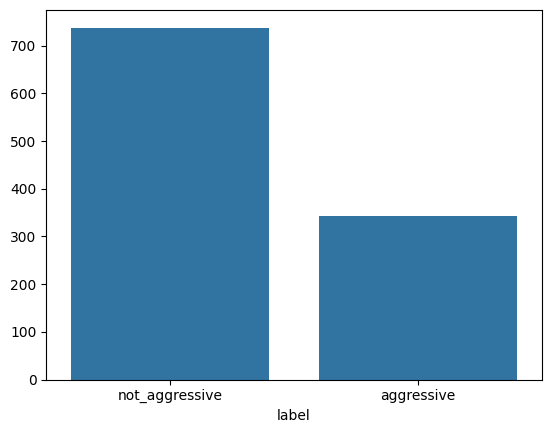

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.barplot(x=df['label'].value_counts().index, y=df['label'].value_counts().values)

In [8]:
df.shape

(1080, 3)

In [3]:
df['path'][0]

'C:\\Users\\aliza\\Desktop\\og_behaviour\\dog_dataset_split\\train\\not_aggressive\\panting_38_preview_19.mp4'

In [8]:
from IPython.display import Video

video_path = df['path'][0]
Video(video_path, embed=True, width=520, height=440)


In [2]:
#independent of above code
import os
import pandas as pd


train_agg= r'C:\Users\aliza\Desktop\og_behaviour\dog_dataset_augmented\train\aggressive'
train_not_agg=r'C:\Users\aliza\Desktop\og_behaviour\dog_dataset_augmented\train\not_aggressive'
test_agg=r'C:\Users\aliza\Desktop\og_behaviour\dog_dataset_augmented\test\aggressive'
test_not_agg=r'C:\Users\aliza\Desktop\og_behaviour\dog_dataset_augmented\test\aggressive'

def get_file_paths(folder, label):
    return [(os.path.join(folder, f), label) 
            for f in os.listdir(folder) if f.endswith(('.mp4', '.avi', '.mov'))]


train_data = []
train_data += get_file_paths(train_agg, "aggressive")
train_data += get_file_paths(train_not_agg, "not_aggressive")
df_train = pd.DataFrame(train_data, columns=["path", "label"]).sample(frac=1, random_state=42).reset_index(drop=True)


test_data = []
test_data += get_file_paths(test_agg, "aggressive")
test_data += get_file_paths(test_not_agg, "not_aggressive")
df_test = pd.DataFrame(test_data, columns=["path", "label"]).sample(frac=1, random_state=42).reset_index(drop=True)


train_csv_path = r'C:\Users\aliza\Desktop\train_aug.csv'
test_csv_path = r'C:\Users\aliza\Desktop\test_aug.csv'

df_train.to_csv(train_csv_path, index=False)
df_test.to_csv(test_csv_path, index=False)

print(f"Train CSV saved at: {train_csv_path}")
print(f"Test CSV saved at: {test_csv_path}")


Train CSV saved at: C:\Users\aliza\Desktop\train_aug.csv
Test CSV saved at: C:\Users\aliza\Desktop\test_aug.csv


In [11]:
from IPython.display import Video

video_path = df_train['path'][0]
Video(video_path, embed=True, width=520, height=440)


In [13]:
len(df_train)
len(df_test)

92